# Dog Breed classification project
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data


## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
#it unzips the uploaded data from Google Drive
#!unzip "/content/drive/MyDrive/Dog Breeds/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Breeds/"

## Get our workspace ready
* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
#import tensor flow into colab
import tensorflow as tf
import tensorflow_hub as hub 
print("TF version:",tf.__version__)
print("TF Hub version:", hub.__version__)
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.8.2
TF Hub version: 0.12.0
GPU available (YESSSS!!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
#checkout the lables of our data from labels.csv
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Breeds/labels.csv")
print(labels_csv.describe())
print("==============================================")
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
#how many images are there in each breed
labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

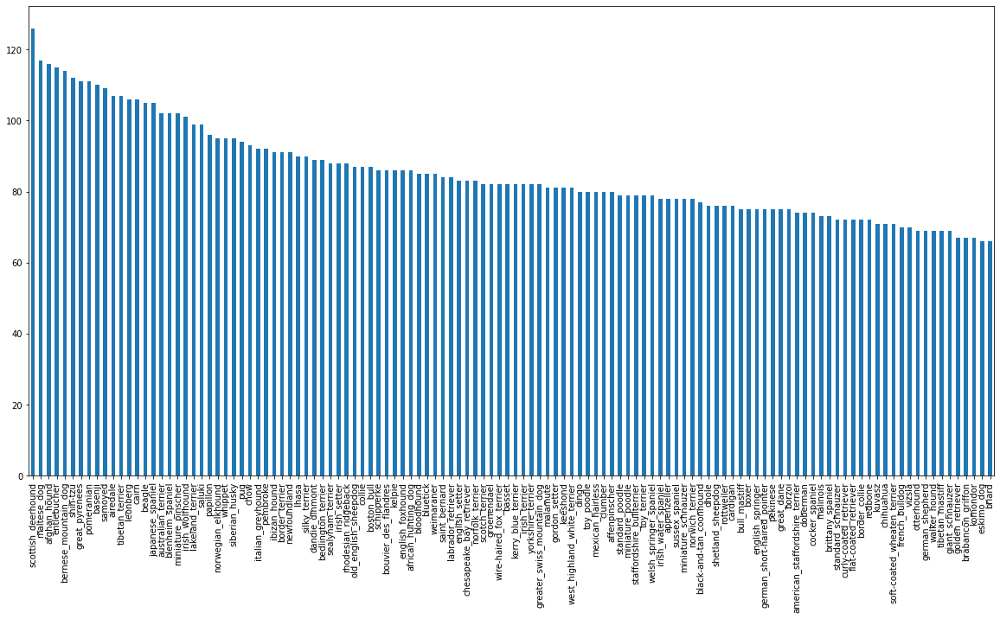

In [ ]:
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [ ]:
# What's the median number of images per class?
labels_csv.breed.value_counts().median()

82.0

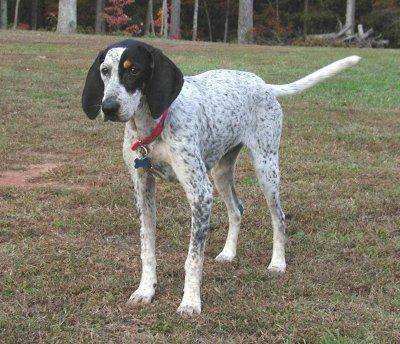

In [ ]:
#lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Breeds/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

## Getting images and their labels
Let's get a list of all of our image file pathnames.

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Breeds/train/"+ fname +".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Breeds/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Breeds/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Breeds/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Breeds/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Breeds/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Breeds/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Breeds/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Breeds/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Breeds/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Breeds/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#we have to make sure that the length of list in filenames is equal to actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Breeds/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


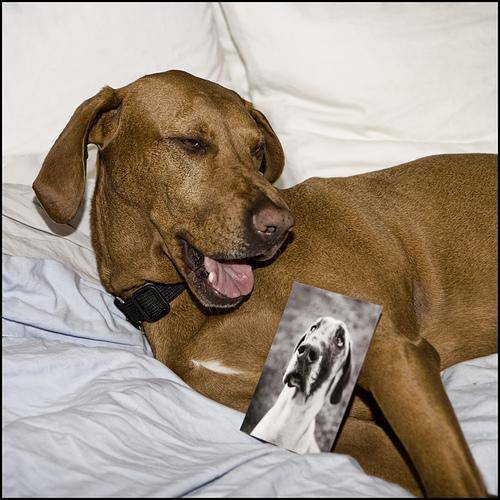

In [ ]:
#one more check
#lets see an image of a dog
Image(filenames[100])


In [ ]:

print("the above image belongs to "+labels_csv.breed[100])

the above image belongs to rhodesian_ridgeback


Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
print(labels_csv.info())
print("==============================================")
print("The object type in breed column is: ",type(labels_csv["breed"][1]))
print("==============================================")
#we change the strings in column =1 to array of string.
labels = np.array(labels_csv["breed"])
print(labels)
print("==============================================")
print(len(labels))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB
None
The object type in breed column is:  <class 'str'>
['boston_bull' 'dingo' 'pekinese' ... 'airedale' 'miniature_pinscher'
 'chesapeake_bay_retriever']
10222


In [ ]:
#lets check whether the number of labels matches the length of filenames
if len(labels) == len(filenames):
  print("Number of labels matches length of filenames")
else:
  print("Number of labels does not match length of filenames,check back again!!!")


Number of labels matches length of filenames


In [ ]:
#lets find the unique labels that are in labels array
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
print(labels[0])
print("=================================")
#lets find where labels[0] is in our unique_breeds array and display as boolean
print(labels[0]==unique_breeds)
print("=================================")
print("position where label[0] occurs inside unique_breeds array: ")
print(np.where(labels[0]==unique_breeds))
#argmax is useful here because True = 1 is our max value in this binary array
print((labels[0]==unique_breeds).argmax())

boston_bull
[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
position where label[0] occurs inside unique_breeds array: 
(array([19]),)
19


In [ ]:
#we repeat the above step for every boolean array
boolean_labels = [each_label ==unique_breeds for each_label in labels]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [ ]:
len(boolean_labels)

10222

## Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
#setup X and y variables
X = filenames #contains path of the file
y = boolean_labels #contains binary array ,we can find the name of the unique breed

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
#set the number of images for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
#lets split our data from training set into train and validation set
from sklearn.model_selection import train_test_split

#split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
#lets see what our training data looks like
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Breeds/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Breeds/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (turning images into Tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:

* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable, image
* Turn our image (a jpg) into Tensors
* Normalize our image (convert color channel values from from 0-255 to 0-1).
* Resize the image to be a shape of (224, 224)
* Return the modified image

Before we do, let's see what importing an image looks like.



In [ ]:
#convert image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# turn image in numpy array ( belonging to filenames[42]) into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [ ]:
#we will use constant image size
IMG_SIZE = 224

#create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  takes an image file path and turns the image into Tensor.
  """
  #Read in a image file
  image = tf.io.read_file(image_path)
  #Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value(224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches
Why turn our data into batches?

Let's say we're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of **Tensor tuples** which look like this: (image, label).

In [ ]:
#Create a simple function to return a tuple
def get_image_label(image_path, label):
  """
  takes an image file path name and the associated label,
  processes the image ang returns a tuple of (image, label)
  """
  #process_image takes an image file path and turns the image into Tensor.
  image = process_image(image_path)
  return image,label


In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (X & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

#functinon to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image(X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (which has no labels, hence y=None in parameter of the function)
  y will be converted to tensors
  """
  #If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) #test has no labels
    #process_image takes in data as input and then processes it as batches
    data = data.map(process_image)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch
  
  elif valid_data:
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y))) #labels
                                        
    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)
    
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating train data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y))) #labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    #we need to shuffle train data and not valid/test data
    data = data.shuffle(buffer_size=len(X))                         

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating train data batches...
Creating valid data batches...


In [ ]:
# Check out the different attributes of our data batches
#output is for image and the label
print(train_data.element_spec )
print("=============================================================")
print(val_data.element_spec)

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))


Our data is in data batches which is tensor flow's preferred way of processing data in GPU. Here None refers to our batch size and each data set it tuple of image and label. dtype=tf.float32 refers to our normalized image and dtype=tf.bool can be  used to find the position in unique list where the breed of the dog in the image occupies. Let's build a function which helps us visualize what's going on under the hood.

## Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt

#function for viewing images in a data batch
def show_25_images(images,labels):
  """
  display images in our data set
  """
  plt.figure(figsize=(10,10))
  #loop through the batch
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)

    #display an image
    plt.imshow(images[i])
    #add image label as title
    #since unique_breeds is binary array with only one true value, we can use 
    #argmax() to find that 1.
    plt.title(unique_breeds[labels[i].argmax()]) 

    # Turn gird lines off
    plt.axis("off")
    

To make computation efficient, a batch is a tighly wound collection of Tensors.

So to view data in a batch, we've got to unwind it.

We can do so by calling the as_numpy_iterator() method on a data batch.

This will turn our a data batch into something which can be iterated over.

Passing an iterable to next() will return the next item in the iterator.

In our case, next will return a batch of 32 images and label pairs.

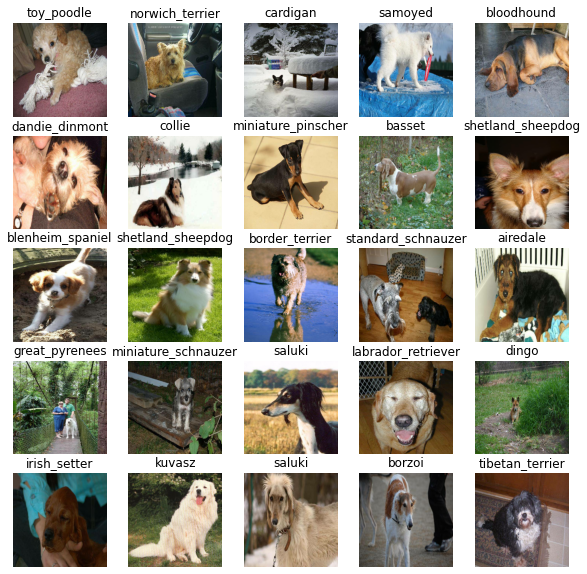

In [ ]:
#visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

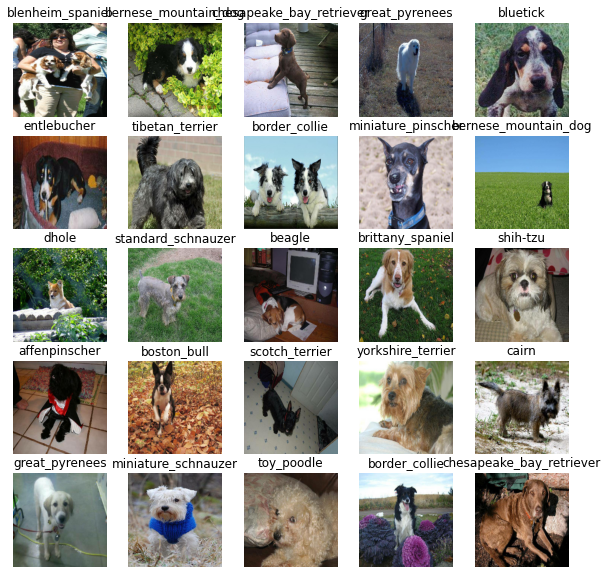

In [ ]:
#visualize training images from the `next` training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

## Creating and training a model
Now our data is ready, let's prepare it modelling. We'll use an existing model from TensorFlow Hub.

TensorFlow Hub is a resource where you can find pretrained machine learning models for the problem you're working on.

Using a pretrained machine learning model is often referred to as transfer learning.

### Why use a pretrained model?
Building a machine learning model and training it on lots from scratch can be expensive and time consuming.

Transfer learning helps alleviate some of these by taking what another model has learned and using that information with your own problem.

### How do we choose a model?
Since we know our problem is image classification (classifying different dog breeds), we can navigate the TensorFlow Hub page by our problem domain (image) (https://tfhub.dev/s?module-type=image-augmentation,image-classification,image-feature-vector,image-generator,image-object-detection,image-others,image-style-transfer,image-rnn-agent).

We start by choosing the image problem domain, and then can filter it down by subdomains, in our case, image classification(https://tfhub.dev/s?module-type=image-classification).

Doing this gives a list of different pretrained models we can apply to our task.

Clicking on one gives us information about the model as well as instructions for using it.

For example, clicking on the mobilenet_v2_130_224 model (https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5), tells us this model takes an input of images in the shape 224, 224. It also says the model has been trained in the domain of image classification.

Let's try it out.

##Building a model
Before we build a model, there are a few things we need to define:

* The input shape (images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

These things will be standard practice with whatever machine learning model you use. And because we're using TensorFlow, everything will be in the form of Tensors.

In [ ]:
#setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channels

#setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

#setup model URL from tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got the inputs, outputs and model url, we're ready to go. We can start to put them together

There are many ways of building a model in TensorFlow but one of the best ways to get started is to use the [Keras API](https://www.tensorflow.org/guide/keras/sequential_model) .

Defining a deep learning model in Keras can be as straightforward as saying, "here are the layers of the model, the input shape and the output shape, let's go!"

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.

We'll take a look at the code first, then dicuss each part.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url =MODEL_URL):
  print("Building model with :", MODEL_URL)

  #setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #layer 1 (input layer)
      tf.keras.layers.Dense(units= OUTPUT_SHAPE,
                            activation="softmax") #layer 2 (output layer)
  ])

  #compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # our model wants to reduce this(how wrong its guesses are)
      optimizer = tf.keras.optimizers.Adam(), # this tells how to improve our guess
      metrics=["accuracy"] #we want the accuracy to go up
  )

  #Build the model
  model.build(INPUT_SHAPE) #this lets the model know of out input shape

  return model

## Setting up the model layers
There are two ways to do this in Keras, the [functional](https://www.tensorflow.org/guide/keras/functional) and [sequential API](https://www.tensorflow.org/guide/keras/sequential_model#build_a_simple_model). We've used the sequential.

Which one should we use?

The Keras documentation states the functional API is the way to go for defining complex models but the sequential API (a linear stack of layers) is perfectly fine for getting started, which is what we're doing.

The first layer we use is the model from TensorFlow Hub (`hub.KerasLayer(MODEL_URL)`. So our first layer is actually an entire model (many more layers). This **input layer** takes in our images and finds patterns in them based on the patterns **mobilenet_v2_130_224** has found.

The next layer (`tf.keras.layers.Dense()`) is the **output layer** of our model. It brings all of the information discovered in the input layer together and outputs it in the shape we're after, 120 (the number of unique labels we have).


The `activation="softmax"` parameter tells the output layer, we'd like to assign a probability value to each of the 120 labels [somewhere between 0 & 1](https://en.wikipedia.org/wiki/Softmax_function). The higher the value, the more the model believes the input image should have that label. If we were working on a binary classification problem, we'd use `activation="sigmoid"`.

For more on which activation function to use, see the article [Which Loss and Activation Functions Should I Use](https://towardsdatascience.com/deep-learning-which-loss-and-activation-functions-should-i-use-ac02f1c56aa8)?

## Compiling the model
This one is best explained with a story.

Let's say you're at the international hill descending championships. Where your start standing on top of a hill and your goal is to get to the bottom of the hill (reducing the `loss`). The catch is you're blindfolded.

Luckily, your friend Adam(`optimizer`) is standing at the bottom of the hill shouting instructions on how to get down.

At the bottom of the hill there's a judge evaluating (`accuracy`) how you're doing. They know where you need to end up so they compare how you're doing to where you're supposed to be. Their comparison is how you get scored.

Transferring this to `model.compile()` terminology:

* `loss` - The height of the hill is the loss function, the models goal is to minimize this, getting to 0 (the bottom of the hill) means the model is learning perfectly.
* `optimizer` - Your friend [Adam](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/) is the optimizer, he's the one telling you how to navigate the hill (lower the loss function) based on what you've done so far. His name is Adam because the Adam optimizer is a great general which performs well on most models. Other optimizers include [RMSprop](ruder.io/optimizing-gradient-descent/index.html#rmsprop) and [Stochastic Gradient Descent](https://en.wikipedia.org/wiki/Stochastic_gradient_descent).
* `metrics` - This is the onlooker at the bottom of the hill rating how well your perfomance is. Or in our case, giving the accuracy of how well our model is predicting the correct image label.

## Building the model
We use `model.build()` whenever we're using a layer from TensorFlow Hub to tell our model what input shape it can expect.

In this case, the input shape is `[None, IMG_SIZE, IMG_SIZE, 3]` or `[None, 224, 224, 3]` or `[batch_size, img_height, img_width, color_channels]`.

Batch size is left as `None` as this is inferred from the data we pass the model. In our case, it'll be 32 since that's what we've set up our data batches as.

Now we've gone through each section of the function, let's use it to create a model.

We can call `summary()` on our model to get idea of what our model looks like.



In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


The non-trainable parameters are the patterns learned by `mobilenet_v2_130_224` and the trainable parameters are the ones in the dense layer we added.

This means the main bulk of the information in our model has already been learned and we're going to take that and adapt it to our own problem.

###Creating callbacks
We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

### TensorBoard Callback
[TensorBoard](https://www.tensorflow.org/tensorboard/get_started) helps provide a visual way to monitor the progress of your model during and after training.

It can be used [directly in a notebook](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize the our models training logs using the `%tensorboard` magic function

In [ ]:
#load the tensor board notebook extension
%load_ext tensorboard

In [ ]:
#for logging
import datetime

#create a fucntion to build a tensorboard callback
def create_tensorboard_callback():
  #crete a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Breeds/logs",
                        #make it so the logs get tracked whenever we run an experiment)
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
[Early stopping](www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [ ]:
#create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) #stops after 3 rounds of no improvements

In [ ]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


## Training a model (on a subset of data)
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

The final parameter we'll define before training is NUM_EPOCHS (also known as number of epochs).

`NUM_EPOCHS` defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

If `NUM_EPOCHS=1`, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself. It would be like you competing in the international hill descent championships and your friend Adam only being able to give you 1 single instruction to get down the hill.

What's a good value for `NUM_EPOCHS`?

This one is hard to say. 10 could be a good start but so could 100. This is one of the reasons we created an early stopping callback. Having early stopping setup means if we set `NUM_EPOCHS` to 100 but our model stops improving after 22 epochs, it'll stop training.

Along with this, let's quickly check if we're still using a GPU.



In [ ]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10,max:100,step:10}

Boom! We've got a GPU running and `NUM_EPOCHS` setup. Let's create a simple function which trains a model. The function will:

* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [ ]:
#build a fucntion to train and return a trained model
def train_model():
  """
  trains a given model and returns the trained version
  """
  #create a model
  model = create_model()

  #create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #fit the model to the data passing with the call backs we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  return model

**Note:** When training a model for the first time, the first epoch will take a while to load compared to the rest. This is because the model is getting ready and the data is being initialised. Using more data will generally take longer, which is why we've started with ~1000 images. After the first epoch, subsequent epochs should take a few seconds.

In [ ]:
# Fit the model to the data
model = train_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 158s 5s/step - loss: 4.6336 - accuracy: 0.0887 - val_loss: 3.3723 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 4s 160ms/step - loss: 1.6481 - accuracy: 0.6787 - val_loss: 2.1483 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 3s 136ms/step - loss: 0.5560 - accuracy: 0.9375 - val_loss: 1.7299 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2473 - accuracy: 0.9912 - val_loss: 1.5491 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 5s 213ms/step - loss: 0.1421 - accuracy: 0.9987 - val_loss: 1.4889 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 5s 206ms/step - loss: 0.0983 - accuracy: 1.0000 - val_loss: 1.4419 - val_accuracy: 0.6100
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model might be overfitting (getting far better results on the training set than the validation set), what are some ways to prevent model overfitting? Hint: this may involve searching something like "ways to prevent overfitting in a deep learning model?".

**Note:** Overfitting to begin with is a good thing. It means our model is learning something.

Thanks to our early_stopping callback, the model stopped training after 25 epochs . This is because the validation accuracy failed to improve for 3 epochs.

But the good new is, we can definitely see our model is learning something. The validation accuracy got to 65% in only a few minutes.

This means, if we were to scale up the number of images, hopefully we'd see the accuracy increase.

###Checking the TensorBoard logs
Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.



In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Breeds/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model
Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.

Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data,verbose=1) #verbose shows us ETA
predictions

NameError: ignored

In [ ]:
#shape of the predictions
predictions.shape

(200, 120)

Making predictions with our model returns an array with a different probability value for each label.

In this case, making predictions on the validation data (200 images) returns an array (predictions) of arrays, each containing 120 different values (one for each unique dog breed).

These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

Let's see how we'd convert an array of probabilities into an actual label.

In [ ]:
#first precition
index=0
print(predictions[index])
print("======================================================")
print(f"Sum: {np.sum(predictions[index])}") #because we used `softmax` as activation the sum of probability =1
print("======================================================")
print(f"Max value of probability: {np.max(predictions[index])}")
print("======================================================")
print(f"Max index:{np.argmax(predictions[index])}")
print("======================================================")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.89940154e-03 9.47239096e-06 2.60722416e-04 8.63848472e-05
 8.03150033e-05 3.28720889e-05 1.91227607e-02 1.94399690e-04
 2.18220448e-05 1.00946135e-03 8.62839166e-04 3.01255524e-04
 1.96898836e-05 1.54103502e-04 9.30121969e-05 8.38766748e-04
 1.03708007e-04 3.37527454e-01 1.54898262e-05 2.48815195e-05
 4.52058535e-04 1.00158984e-04 4.69497063e-05 1.11701910e-03
 9.68238819e-05 2.35888336e-04 7.97893852e-02 1.17982754e-05
 1.11990015e-03 2.97947590e-05 1.64883313e-05 4.05713508e-04
 2.75289902e-04 1.60667387e-05 2.96210310e-05 2.56100912e-02
 1.20421564e-05 1.72072105e-04 2.82360525e-05 1.96875189e-05
 4.42942168e-04 6.08806840e-05 5.86358801e-05 1.49595755e-04
 3.61962520e-05 6.83685721e-05 1.02418035e-05 3.23882050e-05
 2.71335593e-04 5.04158670e-04 6.48359564e-05 3.78786499e-05
 3.32993281e-04 8.37178504e-06 3.21563930e-05 5.80764681e-05
 3.23677959e-05 1.83012767e-03 7.11162400e-04 3.66285145e-01
 2.03553733e-04 1.20141895e-05 5.94456913e-04 1.56150680e-04
 1.75346577e-04 6.546898

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
#function to turn prediction probabilities into their respective labels
def get_pred_labels(prediction_probabilities):
  """
  turn a given array which contains probabilities for each label into label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#get a predicted label based on an array of prediction probabilities
#pred_label = get_pred_labels(predictions[0])
#pred_label

Wonderful! Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the `fit()` function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using `unbatch()`) and then turn it into an iterator using `as_numpy_iterator()`.

Let's make a small function to do so.

In [ ]:
#create a fucntion to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images=[]
  labels=[]

  #loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels



In [ ]:
val_images, val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images


Let's make some functions to make these all a bit more visual.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.


In [ ]:
#function to see the image with predicted label and truth label
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  view the prediction, ground truth label and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  #get the pred label
  pred_label = get_pred_labels(pred_prob)

  #plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])


  #change the color of the tirle depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  plt.title("{} {:2.0f} {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
            color=color)

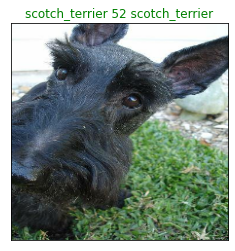

In [ ]:
#view an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,n=1)

Nice! Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using get_pred_label().
* Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
#a fucntion that shows top ten probabilities of a breed that a given image could represent
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #find the rop 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #setting up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels,
             rotation = "vertical")
  
  #change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels== true_label)].set_color("green")
  else:
    pass

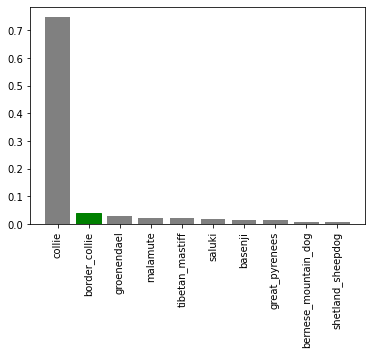

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Wonderful! Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

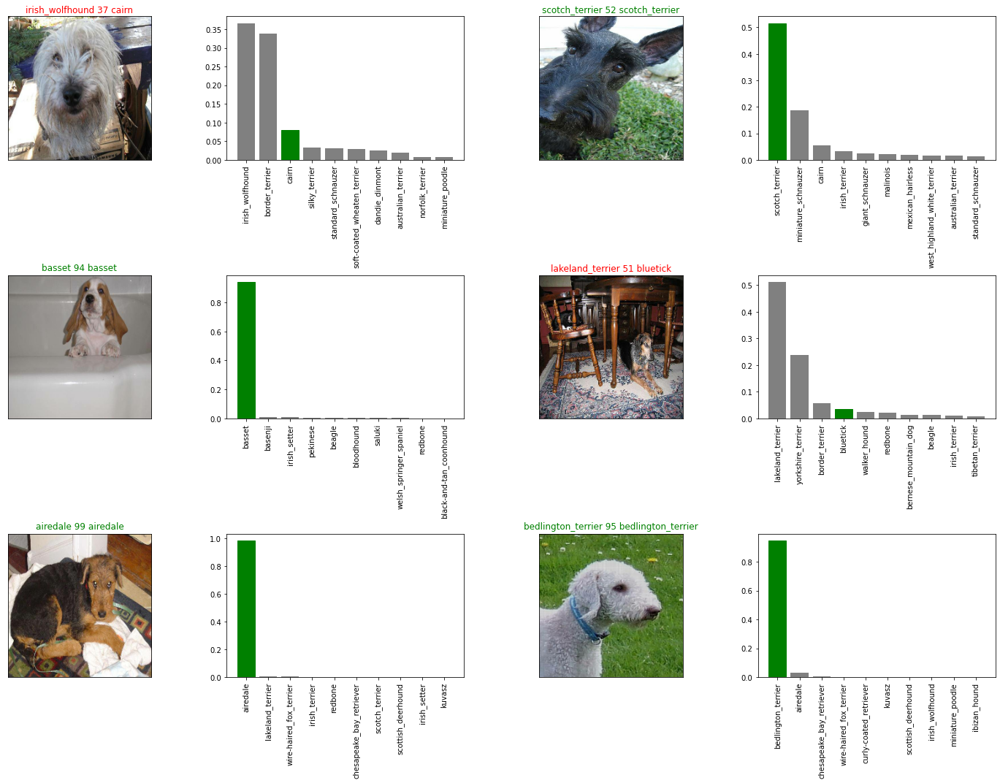

In [ ]:
#lets check a few predictions and their different values
i_multiplier=0
num_rows= 3
num_cols=2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
#create a fucntion to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string).
  """
  #create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Breeds/models",
                          datetime.datetime.now().strftime("%Y%m%d=%H%M%S") )
  model_path = modeldir + "-"+suffix+ ".h5" #save format of the model
  print(f"Saving model to :{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#create a fucntion to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading save model from : {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
#save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to :drive/MyDrive/Dog Breeds/models/20221004-004738-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Breeds/models/20221004-004738-1000-images-mobilenetv2-Adam.h5'

In [ ]:
#load a trained model
load_1000_image_model = load_model("drive/MyDrive/Dog Breeds/models/20221004-004738-1000-images-mobilenetv2-Adam.h5")


Loading save model from : drive/MyDrive/Dog Breeds/models/20221004-004738-1000-images-mobilenetv2-Adam.h5


In [ ]:
#evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 117ms/step - loss: 1.3301 - accuracy: 0.6400


[1.330128788948059, 0.6399999856948853]

In [ ]:
#evaluate the loaded model
load_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 110ms/step - loss: 1.3301 - accuracy: 0.6400


[1.330128788948059, 0.6399999856948853]

##Training a big dog model 🐶 (on the full data)


In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
#create a data batch with full dataset
full_data = create_data_batches(X,y)

Creating train data batches...


In [ ]:
#structrure of full data
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#instantiating full model
full_model = create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
#create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
#no validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
#fit the full model to the full data
full_model.fit(x=full_data,
               epochs= NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 54s 154ms/step - loss: 1.3317 - accuracy: 0.6704
Epoch 2/100
320/320 [==============================] - 50s 158ms/step - loss: 0.4003 - accuracy: 0.8840
Epoch 3/100
320/320 [==============================] - 43s 134ms/step - loss: 0.2355 - accuracy: 0.9373
Epoch 4/100
320/320 [==============================] - 44s 138ms/step - loss: 0.1563 - accuracy: 0.9632
Epoch 5/100
320/320 [==============================] - 46s 144ms/step - loss: 0.1071 - accuracy: 0.9787
Epoch 6/100
320/320 [==============================] - 44s 139ms/step - loss: 0.0763 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 47s 148ms/step - loss: 0.0577 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0462 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 47s 147ms/step - loss: 0.0376 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 48s 149m

In [ ]:
save_model(full_model, suffix="full_image-set_mobilenetv2-Adam")

Saving model to :drive/MyDrive/Dog Breeds/models/20221004=012202-full_image-set_mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Breeds/models/20221004=012202-full_image-set_mobilenetv2-Adam.h5'

In [ ]:
#load the full model
loaded_full_model = load_model('drive/MyDrive/Dog Breeds/models/20221004=012202-full_image-set_mobilenetv2-Adam.h5')

Loading save model from : drive/MyDrive/Dog Breeds/models/20221004=012202-full_image-set_mobilenetv2-Adam.h5



## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.


In [ ]:
#load test image filenames
test_path = "drive/MyDrive/Dog Breeds/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Breeds/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 'drive/MyDrive/Dog Breeds/test/e09859cae41cb59228518c09c3b27362.jpg',
 'drive/MyDrive/Dog Breeds/test/e644a1f6f9c69ee8f7e8d834730bbfd7.jpg',
 'drive/MyDrive/Dog Breeds/test/e427b9e1ab1b7f09cfb02ac073f56f2d.jpg',
 'drive/MyDrive/Dog Breeds/test/e291c3955198350ab26495e9290dbe34.jpg',
 'drive/MyDrive/Dog Breeds/test/e246de79e4efd1145698d9c21466bbaf.jpg',
 'drive/MyDrive/Dog Breeds/test/e2e9e37fa587ad87761da12e105c2b6b.jpg',
 'drive/MyDrive/Dog Breeds/test/e520e4cd7608c47cd9017bb87e88f334.jpg',
 'drive/MyDrive/Dog Breeds/test/e2686707ac5b5f75ce2ccbc906b624d8.jpg',
 'drive/MyDrive/Dog Breeds/test/e1444b7c629f6775432269bfd9c7e758.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
#create a test data batch
test_data = create_data_batches(test_filenames, test_data =True)

Creating test data batches...


In [ ]:
#Make predictions on test data batach using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 4492s 14s/step


In [ ]:
#save predictions (numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Breeds/preds_array.csv",test_predictions, delimiter=",")

In [ ]:
#load predictions (numpy array) from csv file
import numpy as np
test_predictions = np.loadtxt("drive/MyDrive/Dog Breeds/preds_array.csv",delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. 
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with columns names
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1dd78810048dc387573f2ec50e4bb16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e09859cae41cb59228518c09c3b27362,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e644a1f6f9c69ee8f7e8d834730bbfd7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e427b9e1ab1b7f09cfb02ac073f56f2d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e291c3955198350ab26495e9290dbe34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1dd78810048dc387573f2ec50e4bb16,1.784790e-05,5.041183e-08,5.843300e-09,8.590913e-11,4.208755e-09,3.973726e-09,1.090487e-06,3.492843e-09,1.999362e-07,...,5.677479e-04,2.098807e-07,3.893673e-07,1.293281e-08,3.199534e-08,6.598800e-12,4.933827e-07,3.069628e-08,1.344294e-06,1.941930e-06
1,e09859cae41cb59228518c09c3b27362,2.034207e-12,4.883964e-11,2.918644e-09,1.329794e-10,4.157443e-12,2.370042e-08,1.392663e-10,7.246537e-09,1.933114e-12,...,8.055624e-12,5.754601e-09,5.740480e-13,3.419906e-07,2.919228e-09,3.103140e-11,5.906072e-10,2.091525e-10,5.587933e-09,1.627052e-10
2,e644a1f6f9c69ee8f7e8d834730bbfd7,3.279969e-07,1.366642e-08,2.587378e-05,4.261784e-08,3.343878e-06,3.336634e-06,7.520502e-05,1.619981e-07,3.300553e-11,...,3.818481e-07,6.204470e-07,3.249591e-09,4.344379e-09,3.438121e-06,1.567947e-10,3.103432e-07,1.069518e-05,6.764143e-09,3.664745e-09
3,e427b9e1ab1b7f09cfb02ac073f56f2d,1.396185e-08,2.774189e-08,4.308129e-09,5.215325e-08,2.517752e-11,2.969405e-11,6.861891e-08,4.142919e-10,1.374495e-11,...,5.074120e-11,2.219227e-08,3.456527e-12,3.120687e-07,1.670171e-11,4.272972e-09,2.552381e-08,1.689134e-10,9.996909e-01,3.496278e-08
4,e291c3955198350ab26495e9290dbe34,3.800191e-07,5.108602e-09,2.301332e-09,1.820915e-11,6.297847e-09,5.343521e-11,2.594246e-10,7.107894e-09,5.654914e-08,...,9.705375e-09,1.258537e-09,1.478732e-10,2.755324e-11,1.153692e-09,9.508466e-11,3.067330e-09,1.090630e-09,6.907671e-08,6.483503e-08


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Breeds/full_model_predictions_submission_1_mobinetV2.csv",index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
#get custom image file paths
custom_path = "drive/MyDrive/Dog Breeds/custom image/"
custom_image_paths = [custom_path + fname  for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/Dog Breeds/custom image/lab4.jpg',
 'drive/MyDrive/Dog Breeds/custom image/labrador-retriever.jpg',
 'drive/MyDrive/Dog Breeds/custom image/German-Shepherd-Wallpapers.jpg',
 'drive/MyDrive/Dog Breeds/custom image/poodle.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
#get custom image prediction labels
custom_pred_labels = [get_pred_labels(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever',
 'labrador_retriever',
 'german_shepherd',
 'standard_poodle']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

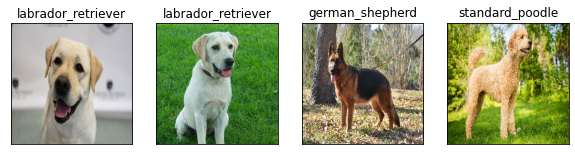

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

## Conclusion:
Thus we were able to make take a model from tensor flow hub and then train it on our data set to make predictions on the given set. Also as an extention I downloaded 4 images of dogs from the internet and I could see that model can predict them correctly. 